<a href="https://colab.research.google.com/github/JahnaviRamagiri/EVA-B2/blob/master/S11_superconvergence/S11_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Memory Information

In [ ]:
import psutil
def get_size(bytes, suffix="B"):
    factor = 1024
    for unit in ["", "K", "M", "G", "T", "P"]:
        if bytes < factor:
            return f"{bytes:.2f}{unit}{suffix}"
        bytes /= factor
print("="*40, "Memory Information", "="*40)
svmem = psutil.virtual_memory()
print(f"Total: {get_size(svmem.total)}") ; print(f"Available: {get_size(svmem.available)}")
print(f"Used: {get_size(svmem.used)}") ; print(f"Percentage: {svmem.percent}%")

======================================== Memory Information ========================================
Total: 25.51GB
Available: 22.89GB
Used: 2.83GB
Percentage: 10.3%


# GPU Information

In [ ]:
!pip install albumentations==0.4.5 --quiet

In [ ]:
!nvidia-smi

Sat Jun 20 12:40:44 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.36.06    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    32W / 250W |   5665MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
device = 'cuda'
from S11_model import S11_Model

In [ ]:
import cv2
model = S11_Model().to(device)

In [ ]:
from augmentation import CIFAR10_AlbumTrans
from data import CIFAR10DataLoader
from data_summary import model_summary, display


Files already downloaded and verified
Files already downloaded and verified


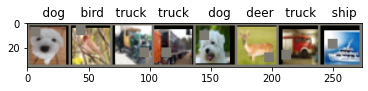

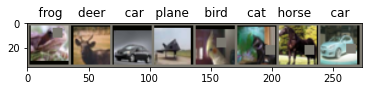

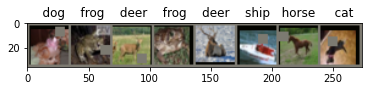

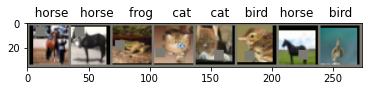

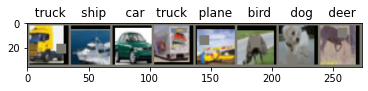

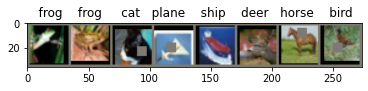

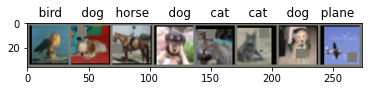

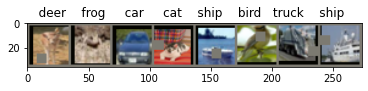

In [ ]:
trans = CIFAR10_AlbumTrans()
data = CIFAR10DataLoader(trans, batch_size=512)
train_loader, test_loader = data.get_loaders()
display(train_loader, 64)

In [ ]:
model_summary(model)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
              ReLU-3           [-1, 64, 32, 32]               0
            Conv2d-4          [-1, 128, 32, 32]          73,728
         MaxPool2d-5          [-1, 128, 16, 16]               0
       BatchNorm2d-6          [-1, 128, 16, 16]             256
            Conv2d-7          [-1, 128, 16, 16]         147,456
       BatchNorm2d-8          [-1, 128, 16, 16]             256
            Conv2d-9          [-1, 128, 16, 16]         147,456
      BatchNorm2d-10          [-1, 128, 16, 16]             256
    BasicResBlock-11          [-1, 128, 16, 16]               0
    ParallelBlock-12          [-1, 128, 16, 16]               0
           Conv2d-13          [-1, 256, 16, 16]         294,912
        MaxPool2d-14            [-1, 25

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
#from find_lr import LRFinder
from lr_finder import LRFinder

  pip install torch-lr-finder -v --global-option="amp"


In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=1e-6, momentum= 0.9)
lr_finder = LRFinder(model, optimizer, criterion, device="cuda")
lr_finder.range_test(train_loader, end_lr=0.1, num_iter=10 * len(train_loader), step_mode="exp")


Learning rate search finished. See the graph with {finder_name}.plot()


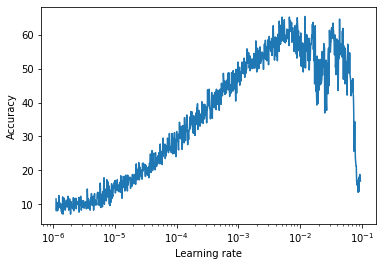

Best acc 65.4296875
Best LR:  0.012041888075915363


In [ ]:
lr_finder.plot(plot_case="acc")
best_lr = lr_finder.get_best_lr(case="acc")

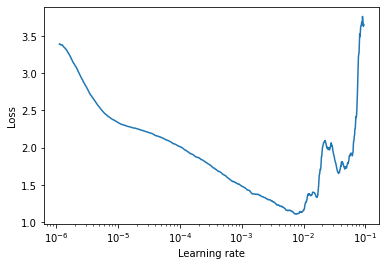

Best loss 1.108140758721108
Best LR:  0.007793387153076188


In [ ]:
lr_finder.plot(plot_case="loss")
best_loss_lr = lr_finder.get_best_lr(case="loss")

In [ ]:
lr_finder.reset()

  0%|          | 0/98 [00:00<?, ?it/s]

====================START====================
==================== EPOCH: 1 ====================


Loss=1.6173131465911865 Batch_id=97 Accuracy=29.28: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0033, Accuracy: 3998/10000 (39.98%)

==================== EPOCH: 2 ====================


  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 5541/10000 (55.41%)

==================== EPOCH: 3 ====================


Loss=0.8766101598739624 Batch_id=97 Accuracy=59.14: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0021, Accuracy: 6289/10000 (62.89%)

==================== EPOCH: 4 ====================


Loss=0.8038276433944702 Batch_id=97 Accuracy=67.02: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 6304/10000 (63.04%)

==================== EPOCH: 5 ====================


Loss=0.6035473346710205 Batch_id=97 Accuracy=74.44: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0016, Accuracy: 7126/10000 (71.26%)

==================== EPOCH: 6 ====================


Loss=0.6552160382270813 Batch_id=97 Accuracy=79.02: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 7836/10000 (78.36%)

==================== EPOCH: 7 ====================


Loss=0.6519107222557068 Batch_id=97 Accuracy=82.00: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 8095/10000 (80.95%)

==================== EPOCH: 8 ====================


Loss=0.3640648424625397 Batch_id=97 Accuracy=83.88: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 8107/10000 (81.07%)

==================== EPOCH: 9 ====================


Loss=0.5457360744476318 Batch_id=97 Accuracy=85.79: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 7994/10000 (79.94%)

==================== EPOCH: 10 ====================


Loss=0.3902778625488281 Batch_id=97 Accuracy=87.54: 100%|██████████| 98/98 [00:13<00:00,  7.09it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 8159/10000 (81.59%)

==================== EPOCH: 11 ====================


Loss=0.3349735736846924 Batch_id=97 Accuracy=88.09: 100%|██████████| 98/98 [00:13<00:00,  7.10it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 8172/10000 (81.72%)

==================== EPOCH: 12 ====================


Loss=0.3251957297325134 Batch_id=97 Accuracy=89.53: 100%|██████████| 98/98 [00:13<00:00,  7.09it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 8674/10000 (86.74%)

==================== EPOCH: 13 ====================


Loss=0.29523494839668274 Batch_id=97 Accuracy=90.41: 100%|██████████| 98/98 [00:13<00:00,  7.09it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 8739/10000 (87.39%)

==================== EPOCH: 14 ====================


Loss=0.24951830506324768 Batch_id=97 Accuracy=91.60: 100%|██████████| 98/98 [00:13<00:00,  7.09it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 8732/10000 (87.32%)

==================== EPOCH: 15 ====================


Loss=0.2548331618309021 Batch_id=97 Accuracy=92.23: 100%|██████████| 98/98 [00:13<00:00,  7.10it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0007, Accuracy: 8839/10000 (88.39%)

==================== EPOCH: 16 ====================


Loss=0.1832299530506134 Batch_id=97 Accuracy=93.54: 100%|██████████| 98/98 [00:13<00:00,  7.09it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0007, Accuracy: 8781/10000 (87.81%)

==================== EPOCH: 17 ====================


Loss=0.21593940258026123 Batch_id=97 Accuracy=94.27: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0007, Accuracy: 8882/10000 (88.82%)

==================== EPOCH: 18 ====================


Loss=0.18647515773773193 Batch_id=97 Accuracy=94.94: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0007, Accuracy: 8876/10000 (88.76%)

==================== EPOCH: 19 ====================


Loss=0.14402414858341217 Batch_id=97 Accuracy=95.77: 100%|██████████| 98/98 [00:13<00:00,  7.10it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0006, Accuracy: 9049/10000 (90.49%)

==================== EPOCH: 20 ====================


Loss=0.1948748379945755 Batch_id=97 Accuracy=96.38: 100%|██████████| 98/98 [00:13<00:00,  7.10it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0006, Accuracy: 9044/10000 (90.44%)

==================== EPOCH: 21 ====================


Loss=0.1076221689581871 Batch_id=97 Accuracy=96.98: 100%|██████████| 98/98 [00:13<00:00,  7.10it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0005, Accuracy: 9089/10000 (90.89%)

==================== EPOCH: 22 ====================


Loss=0.11698763817548752 Batch_id=97 Accuracy=97.28: 100%|██████████| 98/98 [00:13<00:00,  7.11it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0005, Accuracy: 9124/10000 (91.24%)

==================== EPOCH: 23 ====================


Loss=0.08608264476060867 Batch_id=97 Accuracy=97.54: 100%|██████████| 98/98 [00:13<00:00,  7.10it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0005, Accuracy: 9105/10000 (91.05%)

==================== EPOCH: 24 ====================


Loss=0.08128420263528824 Batch_id=97 Accuracy=97.68: 100%|██████████| 98/98 [00:13<00:00,  7.12it/s]



Test set: Average loss: 0.0005, Accuracy: 9116/10000 (91.16%)



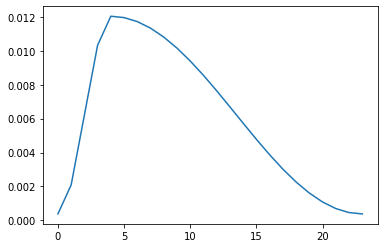

In [ ]:
from test import Test
from train import Train
from torch.optim.lr_scheduler import OneCycleLR #ReduceLROnPlateau
import matplotlib.pyplot as plt



#for i in range (5,11):
  #optimizer = optim.SGD(model.parameters(), lr=best_lr, momentum= 0.9,weight_decay=0.01)

  #scheduler =torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode= 'max', patience= 2)
lr_list = []
  
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), best_lr, momentum=0.9, weight_decay=1e-2) #, nesterov=True, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer,
                  max_lr=best_lr,
                  total_steps=24,
                  steps_per_epoch = len(train_loader),
                  epochs=24,
                  pct_start=5/24,
                  cycle_momentum=False,
                  div_factor=32,
                  final_div_factor=1,
                  anneal_strategy ='cos',
                  #annihilation_frac=0,
                  last_epoch=-1)
 # print('='*30 + f' div: {i} ' + '='*30)
epochs = 24
print('='*20 + 'START' + '='*20)
test = Test(model, device, test_loader)
train = Train(model, device, train_loader, optimizer)
for epoch in range(epochs):
    print('='*20 + f' EPOCH: {epoch+1} ' + '='*20)
    train.train(epoch)
    lr_list.append(optimizer.param_groups[0]['lr'])
    test.test()
    scheduler.step() #Have to give the val_loss or val_accuracy here. The metric on which we can to check 
    #test.test()
  #fig, axs = plt.subplots(4,1,figsize=(15,10))
plt.plot(lr_list)
   

In [ ]:
import plot
from plot import mis, gen_cam, plot_pred_cam, plot_act_cam

In [ ]:
best_model = S11_Model().to(device)
best_model.load_state_dict(torch.load('/content/classifier.pt'))
best_model.eval()
print('Best Model Loaded!')

Best Model Loaded!


Directory  /content/mis_class/  Created 
Directory  /content/mis_class/images  Created 

Test set: Average loss: -7.4751, Accuracy: 9124/10000 (91.24%)

torch.Size([876, 3, 32, 32])


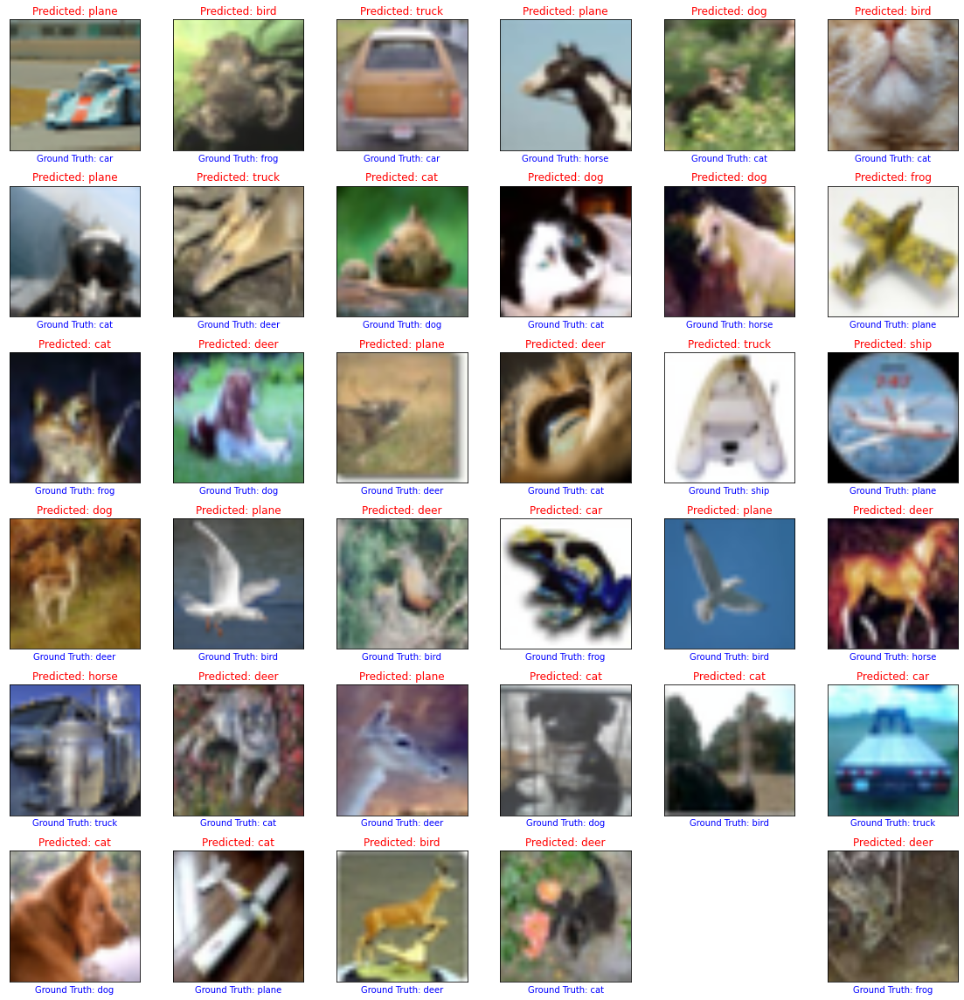

In [ ]:
mis(best_model, device, test_loader, 36)

In [ ]:
layers = ['layer1', 'layer2', 'layer3',]
for layer in layers:
  gen_cam(best_model, layer) #GradCAM for Misclassified w.r.t Predicted Class
  gen_cam(best_model, layer, class_idx= plot.true_list) #GradCAM for Misclassified w.r.t Actual Class

Directory  /content/result_pred/  Created 
Directory  /content/heatmap_pred/  Created 
Directory  /content/result_act/  Created 
Directory  /content/heatmap_act/  Created 
Directory  /content/result_pred/  already exists
Directory  /content/heatmap_pred/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists
Directory  /content/result_pred/  already exists
Directory  /content/heatmap_pred/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists


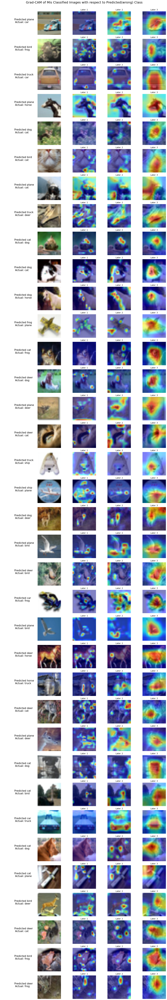

In [ ]:
plot_pred_cam(36, 3)

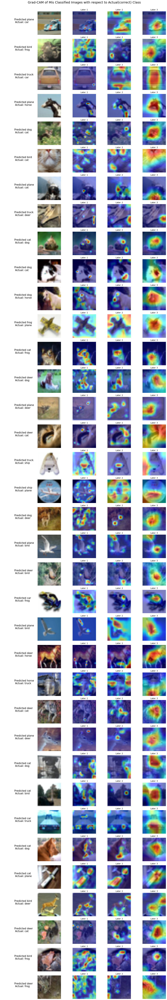

In [ ]:
plot_act_cam(36,3)

In [ ]:
from graphs import acc_loss, testvtrain, class_acc

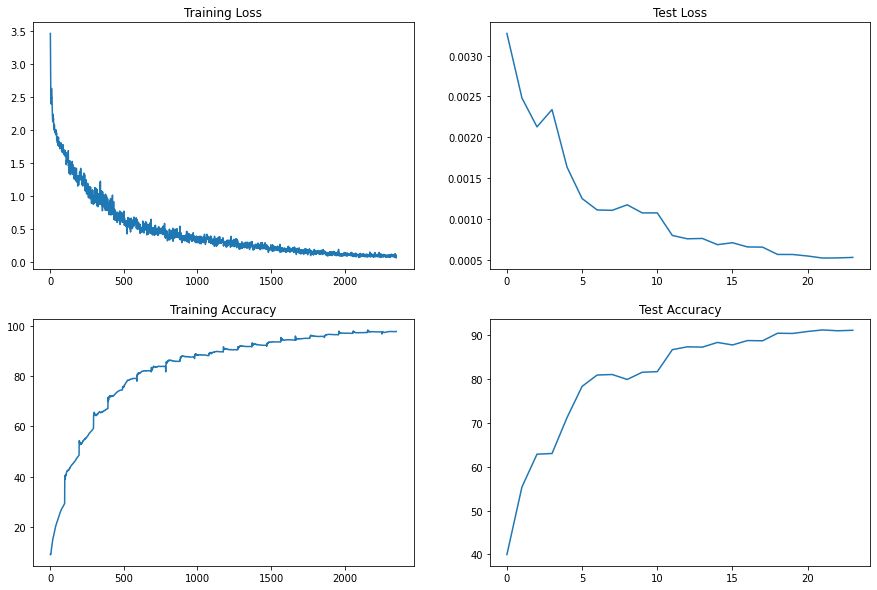

In [ ]:
acc_loss(train, test)

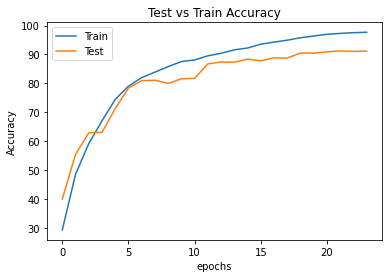

In [ ]:
testvtrain(train, test)

In [ ]:
class_acc(model, device, test_loader)

Accuracy of plane : 96 %
Accuracy of   car : 96 %
Accuracy of  bird : 88 %
Accuracy of   cat : 84 %
Accuracy of  deer : 91 %
Accuracy of   dog : 85 %
Accuracy of  frog : 90 %
Accuracy of horse : 91 %
Accuracy of  ship : 94 %
Accuracy of truck : 93 %


In [ ]:
optimizer.param_groups[0]['lr']

0.0004558606491801568

In [ ]:
len(lr_list)

24

In [ ]:
set_lr = set(lr_list)

In [ ]:
len(set_lr)

24

In [ ]:
set_lr

{0.0003763090023723551,
 0.0003763090023723558,
 0.00045586064918015743,
 0.0006923456280543128,
 0.0010793132452414653,
 0.0016062080328940406,
 0.0020846935044587876,
 0.0022586576747170776,
 0.0030188650452909224,
 0.0038660936692590337,
 0.00477723335831975,
 0.0057274305969194,
 0.0062090985391438595,
 0.006690766481368318,
 0.007640963719967968,
 0.008552103409028686,
 0.009399332032996798,
 0.010159539403570643,
 0.010333503573828931,
 0.01081198904539368,
 0.011338883833046253,
 0.011725851450233405,
 0.01196233642910756,
 0.012041888075915363}

In [ ]:
import matplotlib.pyplot as plt

Text(0, 0.5, 'Learning Rate')

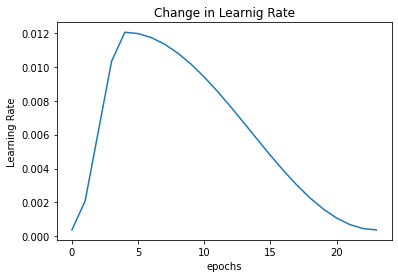

In [ ]:
plt.plot(lr_list)
plt.title('Change in Learning Rate')
plt.xlabel('epochs')
plt.ylabel('Learning Rate')